# Indicators

## Dependencies and definitions



### Silhouette, DB, Calinski Harabasz, ARI, NMI, C

In [ ]:
import pandas as pd,numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.cluster import KMeans
!pip install git+https://github.com/jqmviegas/jqm_cvi.git
from jqmcvi import base
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from math import sqrt
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestCentroid
!pip install c_index
from c_index import calc_c_index

  Cloning https://github.com/jqmviegas/jqm_cvi.git to /tmp/pip-req-build-8ds8xwt_
  Running command git clone --filter=blob:none --quiet https://github.com/jqmviegas/jqm_cvi.git /tmp/pip-req-build-8ds8xwt_
  Resolved https://github.com/jqmviegas/jqm_cvi.git to commit 9e1137d4f4df70c1287011e1a544b0c3fe36af36
  Preparing metadata (setup.py) ... done


### WB, Dunn

In [ ]:
# WB_index=(1/calinski_harabasz_score(df,c)) * p*(l-p)/(p-1)
# base.dunn(C4_list)

### sDbw

In [ ]:
import numpy as np
from sklearn.metrics import pairwise_distances
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

class sDbw:
  def scatter(self, X, labels):
      n_clusters = len(set(labels))
      cluster_centers = np.zeros((n_clusters, X.shape[1]))

      for i in range(n_clusters):
          cluster_points = X[labels == i]
          cluster_center = np.mean(cluster_points, axis=0)
          cluster_centers[i] = cluster_center

      total_scatter = 0.0
      for i in range(n_clusters):
          cluster_points = X[labels == i]
          cluster_center = cluster_centers[i]
          scatter_i = np.sum(np.linalg.norm(cluster_points - cluster_center, axis=1))
          total_scatter += scatter_i

      return total_scatter

  def density(self, X, labels):
      n_clusters = len(set(labels))
      total_density = 0.0

      for i in range(n_clusters):
          cluster_points = X[labels == i]
          scatter_i = self.scatter(cluster_points, np.zeros(len(cluster_points)))
          density_i = np.sqrt(scatter_i / len(cluster_points))
          total_density += density_i

      total_density /= n_clusters
      return total_density

  def S_Dbw(self, X, labels):
      scatter_term = self.scatter(X, labels)
      density_term = self.density(X, labels)
      self.sdbw = scatter_term + density_term
      return self.sdbw

# # Generate sample dat

# # Perform clustering (example with K-means)
# kmeans = KMeans(n_clusters=p,random_state=42)
# labels = kmeans.fit_predict(df)

# # Calculate the S_Dbw index
# s_dbw_index = S_Dbw(df, labels)

# print(f"S_Dbw Index: {s_dbw_index}")

### Gamma

In [ ]:
import numpy as np

def calculate_gamma(x, y):
     n = len(x)
     concordant_pairs = 0
     discordant_pairs = 0

     for i in range(n):
         for j in range(i + 1, n):
             if (np.all(x[i] < x[j]) and np.all(y[i] < y[j])) or (np.all(x[i] > x[j]) and np.all(y[i] > y[j])):
                 concordant_pairs += 1
             elif (np.all(x[i] < x[j]) and np.all(y[i] > y[j])) or (np.all(x[i] > x[j]) and np.all(y[i] < y[j])):
                 discordant_pairs += 1

     gamma = (concordant_pairs - discordant_pairs) / (concordant_pairs + discordant_pairs)
     return gamma

# # Example usage
# x = np.array(df['X'])
# y = np.array(df['Y'])

# gamma_index = calculate_gamma(x, y)
# print(f"Goodman and Kruskal’s Gamma Index: {gamma_index}")

### cvdd

In [ ]:
import numpy as np
import csv
from scipy.spatial.distance import pdist, squareform
import networkx as nx

'''
path = "/Users/sumedha/Documents/cvi/NewISI/Image1_xl.csv"
with open(path, 'r') as f:
    df = csv.reader(f, delimiter=',')
    df = list(df)
    df = np.array(df[1:]).astype(float)

print(df[:5])

dat = df[:,:-1]
print(dat[:5])
'''

# Example dataset: each row is a data point
# data = np.array([
#     [1, 2],
#     [3, 4],
#     [5, 6],
#     [7, 8]
# ])

# Compute the pairwise distance matrix
# 'pdist' computes the pairwise distances
# 'squareform' converts the condensed distance matrix to a square form
class cvdd:

#print("Distance Matrix:\n", distance_matrix[:5,:])

  def KNearestNeighborGraph(self, dist, K):
      N = dist.shape[0]

      # Set the diagonal elements to infinity
      np.fill_diagonal(dist, np.iinfo(np.int64).max)

      # Sort each row and get the indices
      indSort = np.argsort(dist, axis=1)

      # Initialize the result list
      KNNG = [None] * N

      for i in range(N):
          KNNG[i] = indSort[i, :K].tolist()

      return KNNG

# Example usage
#dist = np.array([[0, 2, 3], [2, 0, 1], [3, 1, 0], [3, 0, 6], [2, 3, 0]])
# K = 5
#KNNG = KNearestNeighborGraph(dist_matrix, K)
#print(KNNG)

  def fast_PathbasedDist(self, W):
      # Generate the minimum spanning tree
      G = nx.Graph(W)
      MST0 = nx.minimum_spanning_tree(G)
      Pairs = np.array(list(MST0.edges()))
      N = W.shape[0]
      PathbasedW = np.zeros((N, N))
      Degrees = np.zeros(N, dtype=int)
      Connections = np.zeros((N, N), dtype=int)

      # Fill degrees and connections
      for i in range(N - 1):
          Degrees[Pairs[i, 0]] += 1
          Degrees[Pairs[i, 1]] += 1
          Connections[Pairs[i, 0], Degrees[Pairs[i, 0]] - 1] = Pairs[i, 1]
          Connections[Pairs[i, 1], Degrees[Pairs[i, 1]] - 1] = Pairs[i, 0]

      for i in range(N):
          if Degrees[i] == 1:  # first node with one edge
              break

      CloseT = np.zeros(N, dtype=int)
      OpenT = np.zeros(N, dtype=int)
      cursor_C = 0
      cursor_T = 0

      cursor_C += 1
      CloseT[cursor_C - 1] = i
      Visited = np.zeros(N, dtype=int)
      Visited[i] = 1

      while cursor_C < N:
          # nodes connected to the current node in close table
          Nodes1 = Connections[CloseT[cursor_C - 1], :Degrees[CloseT[cursor_C - 1]]]
          Nodes = Nodes1[Visited[Nodes1] == 0]

          for node in Nodes:
              # Nodes to Close table
              for j in range(cursor_C):
                  PathbasedW[CloseT[j], node] = max(PathbasedW[CloseT[j], CloseT[cursor_C - 1]], W[CloseT[cursor_C - 1], node])
                  PathbasedW[node, CloseT[j]] = PathbasedW[CloseT[j], node]

              # Nodes to Open table
              for j in range(cursor_T):
                  PathbasedW[OpenT[j], node] = max(PathbasedW[OpenT[j], CloseT[cursor_C - 1]], W[CloseT[cursor_C - 1], node])
                  PathbasedW[node, OpenT[j]] = PathbasedW[OpenT[j], node]

          # Nodes each other
          for i in range(len(Nodes) - 1):
              for j in range(i + 1, len(Nodes)):
                  PathbasedW[Nodes[i], Nodes[j]] = max(W[Nodes[i], CloseT[cursor_C - 1]], W[Nodes[j], CloseT[cursor_C - 1]])
                  PathbasedW[Nodes[j], Nodes[i]] = PathbasedW[Nodes[i], Nodes[j]]

          for node in Nodes:
              # Nodes are added into OpenT
              cursor_T += 1
              OpenT[cursor_T - 1] = node

          cursor_C += 1
          CloseT[cursor_C - 1] = OpenT[cursor_T - 1]
          Visited[OpenT[cursor_T - 1]] = 1
          cursor_T -= 1

      return PathbasedW

# Example usage
# W = np.array([
#     [0, 2, 3],
#     [2, 0, 1],
#     [3, 1, 0]
# ])
#PathbasedW = fast_PathbasedDist(dist_matrix)
#print(PathbasedW)


  def Density_involved_distance(self, d, K):
      # Compute density-involved distance
      N = d.shape[0]

      # Get K nearest neighbor graph
      KNNG = self.KNearestNeighborGraph(d, K)

      # Compute density
      Den = np.zeros(N)
      for j in range(N):
          Den[j] = np.sum(d[j, KNNG[j]]) / K

      # Absolute-density distance factor
      fDen = Den / np.max(Den)

      # Relative-density distance factor
      Rel = np.tile(Den, (N, 1)).T / np.tile(Den, (N, 1))
      tmp1 = Rel + Rel.T
      fRel = 1 - np.exp(-np.abs(tmp1 - 2))

      # Compute nD and relD
      nD = np.tile(Den, (N, 1)).T + np.tile(Den, (N, 1))
      relD = nD * fRel

      # Directly density-reachable distance
      drD = d + relD

      # Connectivity distance
      conD = self.fast_PathbasedDist(drD)

      # Final density-involved distance
      tmp2 = np.sqrt(np.tile(fDen, (N, 1)).T * np.tile(fDen, (N, 1)))
      DD = conD * tmp2

      return DD

# Example usage
# d = np.array([
#     [0, 2, 3],
#     [2, 0, 1],
#     [3, 1, 0]
# ])
# DD = Density_involved_distance(dist_matrix, K)
#print(DD)

  def CVDD(self, pi, d, DD):
      NC = len(np.unique(pi))
      sc_list = np.zeros(NC)
      com_list = np.zeros(NC)

      for i in range(NC):
          a = np.where(pi == i + 1)[0]
          b = pi != i + 1
          n = len(a)

          if len(a) != 0:
              sc_list[i] = np.min(DD[np.ix_(a, b)])

              try:
                  Ci = self.fast_PathbasedDist(d[np.ix_(a, a)])
                  com_list[i] = (np.std(Ci) / n) * np.mean(Ci)
              except:
                  com_list[i] = np.max(com_list)
          else:
              sc_list[i] = 0
              com_list[i] = np.max(com_list)

      sep = np.sum(sc_list)
      com = np.sum(com_list)
      CVDD = sep / com

      return CVDD

  def calc_CVDD(self, df):
    self.df = df
    self.dat = df.iloc[:,:-1]
    self.pi = df.iloc[:,-1]

    self.dist_matrix = squareform(pdist(self.dat, 'euclidean'))

    self.DD = self.Density_involved_distance(self.dist_matrix, len(self.dist_matrix))

    self.cvdd = self.CVDD(self.pi, self.dist_matrix, self.DD)

    return self.cvdd

# Example usage
# pi = df[:,2]
#d = np.array([
#    [0, 2, 3],
#    [2, 0, 1],
#    [3, 1, 0]
#])
#DD = np.array([
#    [0, 2, 3, 4],
#    [2, 0, 1, 5],
#    [3, 1, 0, 6],
#    [4, 5, 6, 0]
#])

### gpt - cvdd

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
import networkx as nx

class cvdd:

    def KNearestNeighborGraph(self, dist, K):
        N = dist.shape[0]
        np.fill_diagonal(dist, np.inf)
        indSort = np.argsort(dist, axis=1)
        KNNG = [indSort[i, :K].tolist() for i in range(N)]
        return KNNG

    def fast_PathbasedDist(self, W):
        G = nx.Graph(W)
        MST0 = nx.minimum_spanning_tree(G)
        Pairs = np.array(list(MST0.edges()))
        N = W.shape[0]
        PathbasedW = np.zeros((N, N))
        Degrees = np.zeros(N, dtype=int)
        Connections = np.zeros((N, N), dtype=int)

        for i in range(N - 1):
            Degrees[Pairs[i, 0]] += 1
            Degrees[Pairs[i, 1]] += 1
            Connections[Pairs[i, 0], Degrees[Pairs[i, 0]] - 1] = Pairs[i, 1]
            Connections[Pairs[i, 1], Degrees[Pairs[i, 1]] - 1] = Pairs[i, 0]

        for i in range(N):
            if Degrees[i] == 1:
                break

        CloseT = np.zeros(N, dtype=int)
        OpenT = np.zeros(N, dtype=int)
        cursor_C = cursor_T = 0
        cursor_C += 1
        CloseT[cursor_C - 1] = i
        Visited = np.zeros(N, dtype=int)
        Visited[i] = 1

        while cursor_C < N:
            Nodes1 = Connections[CloseT[cursor_C - 1], :Degrees[CloseT[cursor_C - 1]]]
            Nodes = Nodes1[Visited[Nodes1] == 0]

            for node in Nodes:
                for j in range(cursor_C):
                    PathbasedW[CloseT[j], node] = max(PathbasedW[CloseT[j], CloseT[cursor_C - 1]], W[CloseT[cursor_C - 1], node])
                    PathbasedW[node, CloseT[j]] = PathbasedW[CloseT[j], node]

                for j in range(cursor_T):
                    PathbasedW[OpenT[j], node] = max(PathbasedW[OpenT[j], CloseT[cursor_C - 1]], W[CloseT[cursor_C - 1], node])
                    PathbasedW[node, OpenT[j]] = PathbasedW[OpenT[j], node]

            for i in range(len(Nodes) - 1):
                for j in range(i + 1, len(Nodes)):
                    PathbasedW[Nodes[i], Nodes[j]] = max(W[Nodes[i], CloseT[cursor_C - 1]], W[Nodes[j], CloseT[cursor_C - 1]])
                    PathbasedW[Nodes[j], Nodes[i]] = PathbasedW[Nodes[i], Nodes[j]]

            for node in Nodes:
                cursor_T += 1
                OpenT[cursor_T - 1] = node

            cursor_C += 1
            CloseT[cursor_C - 1] = OpenT[cursor_T - 1]
            Visited[OpenT[cursor_T - 1]] = 1
            cursor_T -= 1

        return PathbasedW

    def Density_involved_distance(self, d, K):
        N = d.shape[0]
        KNNG = self.KNearestNeighborGraph(d, K)
        Den = np.array([np.sum(d[j, KNNG[j]]) / K for j in range(N)])

        max_Den = np.max(Den)
        if max_Den == 0:
            fDen = np.zeros_like(Den)
        else:
            fDen = Den / max_Den

        Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))
        fRel = 1 - np.exp(-np.abs(Rel + Rel.T - 2))

        nD = np.tile(Den, (N, 1)).T + np.tile(Den, (N, 1))
        relD = nD * fRel
        drD = d + relD

        conD = self.fast_PathbasedDist(drD)
        tmp2 = np.sqrt(np.tile(fDen, (N, 1)).T * np.tile(fDen, (N, 1)))
        DD = conD * tmp2

        if np.isnan(DD).any():
            DD = np.nan_to_num(DD, nan=np.max(DD[np.isfinite(DD)]))

        return DD

    def CVDD(self, pi, d, DD):
        NC = len(np.unique(pi))
        sc_list = np.zeros(NC)
        com_list = np.zeros(NC)

        for i in range(NC):
            a = np.where(pi == i + 1)[0]
            b = pi != i + 1
            n = len(a)

            if len(a) != 0:
                sc_list[i] = np.min(DD[np.ix_(a, b)])
                try:
                    Ci = self.fast_PathbasedDist(d[np.ix_(a, a)])
                    com_list[i] = (np.std(Ci) / n) * np.mean(Ci)
                except:
                    com_list[i] = np.max(com_list)
            else:
                sc_list[i] = 0
                com_list[i] = np.max(com_list)

        sep = np.sum(sc_list)
        com = np.sum(com_list)
        CVDD = sep / com

        return CVDD

    def calc_CVDD(self, df):
        self.df = df
        self.dat = df.iloc[:, :-1]
        self.pi = df.iloc[:, -1]
        self.dist_matrix = squareform(pdist(self.dat, 'euclidean'))
        self.DD = self.Density_involved_distance(self.dist_matrix, len(self.dist_matrix))
        self.cvdd = self.CVDD(self.pi, self.dist_matrix, self.DD)
        return self.cvdd

# Example usage
# df = pd.read_csv('path/to/your/csv')
# ind = cvdd()
# cvdd_value = ind.calc_CVDD(df)
# print(cvdd_value)


### ocvd

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from sklearn.neighbors import KernelDensity
import math as m
import numpy as np
import seaborn as sb

class OCVD:
  def __init__(self):
    self.clusters = []
    self.clusters_test = []

    self.likelihoods = []
    self.priors = []
    self.posteriors = []
    self.products = []

    self.OCVD_k = 0

  def calc_likelihoods(self):
    # P(x_i|C_j)
    for c in self.clusters_test:
      c_len = len(c)
      self.kde = KernelDensity(kernel=self.kernel, bandwidth=self.bandwidth).fit(c)
      Xi = self.kde.score_samples(self.df_test)
      Xi = np.vectorize(lambda x: m.e**x/c_len)(Xi)
      self.likelihoods.append(Xi)

  def calc_priors(self):
    # P(C_j)
    total_len = len(self.df)
    for c in self.clusters_test:
      self.priors.append(len(c)/total_len)

  def calc_products(self):
    # P(C_j|x_i)
    self.N = len(self.likelihoods[0])
    self.sum_product = np.zeros(self.N)
    for i in range(self.k):
      self.products.append(np.vectorize(lambda x: x*self.priors[i])(self.likelihoods[i]))
      self.sum_product = np.add(self.sum_product, self.products[i])
    for i in range(self.k):
      with np.errstate(divide='ignore', invalid='ignore'):
        result = np.divide(self.products[i], self.sum_product)
        result = np.where(self.sum_product == 0, -1000, result)
      self.posteriors.append(result)


  def calc_table(self):
    # table of P(C_li|x_i) - max P(C_k|x_i)
    # OCVD_k
    self.OCVD_table = pd.DataFrame(0, index=range(self.N), columns=range(self.k))
    Object_OCVD = pd.DataFrame(0, index=range(self.N), columns=['Object OCVD'])
    for i in range(self.N):
      for j in range(self.k):
        self.OCVD_table.loc[i, j] = self.posteriors[j][i]
    self.OCVD_table = pd.concat([self.OCVD_table, self.df[self.labels_col]], axis=1)
    self.OCVD_table['Object OCVD'] = self.OCVD_table.apply(self.pdiff, axis=1)
    self.OCVD_k = self.OCVD_table['Object OCVD'].mean()

  def pdiff(self, row):
      label_value = row[row[self.labels_col]]
      other_values = row.drop([int(row[self.labels_col].item())])
      other_values = other_values.drop([self.labels_col])
      return label_value - other_values.max()

  def calc_OCVD(self, df, labels_col='labels', kernel='gaussian', bandwidth='silverman'):
    self.df = df
    self.labels_col = labels_col
    self.k = self.df[self.labels_col].nunique()
    self.df_test = self.df.drop([self.labels_col], axis=1)
    label_encoder = LabelEncoder()
    self.df[self.labels_col] = label_encoder.fit_transform(self.df[self.labels_col])
    self.kernel = kernel
    self.bandwidth = bandwidth

    for i in range(self.k):
      self.clusters.append(self.df[self.df[self.labels_col]==i])
    for c in self.clusters:
      self.clusters_test.append(c.drop([self.labels_col], axis=1))

    self.calc_likelihoods()
    self.calc_priors()
    self.calc_products()
    self.calc_table()

    return self.OCVD_k

  def getParams(self):
    return self.kde.get_params

### dsi

In [ ]:
import numpy as np
import scipy.spatial.distance as distance
from scipy.stats import ks_2samp
from sklearn import cluster, mixture
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics.pairwise import euclidean_distances

class dsi:
  def dists(self, data, dist_func=distance.euclidean):  # compute ICD
      num = data.shape[0]
      data = data.reshape((num, -1))
      dist = []
      for i in range(0, num - 1):
          for j in range(i + 1, num):
              dist.append(dist_func(data[i], data[j]))
      return np.array(dist)


  def dist_btw(self, a, b, dist_func=distance.euclidean):  # compute BCD
      a = a.reshape((a.shape[0], -1))
      b = b.reshape((b.shape[0], -1))
      dist = []
      for i in range(a.shape[0]):
          for j in range(b.shape[0]):
              dist.append(dist_func(a[i], b[j]))
      return np.array(dist)


  def separability_index_ks_2samp(self, X, labels):  # KS test on ICD and BCD
      classes = np.unique(labels)
      SUM = 0
      for c in classes:
          pos = X[np.squeeze(labels == c)]
          neg = X[np.squeeze(labels != c)]

          dist_pos = self.dists(pos)
          distbtw = self.dist_btw(pos, neg)
          D, _ = ks_2samp(dist_pos, distbtw)  # KS test
          SUM += D
      SUM = SUM / classes.shape[0]  # normed: b/c ks_2samp ranges [0,1]
      return SUM

# Make latex table

In [ ]:
def formattable(data):
  for line in data:
    print(" & ".join([str(x) for x in line])+" \\\\")

In [ ]:
data = [[1, 0, 0, 0],[0, 1, 0, 0]]
formattable(data)

1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\


# Synthetic Datasets

## Dataset prep

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

df = pd.read_csv('/content/drive/MyDrive/clusterincluster.txt', delimiter=' ')  # adjust delimiter as needed

df.to_csv('/content/drive/MyDrive/clusterincluster.csv', index=False)

Mounted at /content/drive


In [ ]:
names = ['hepta', 'tetra', 'Image1_xl', 'Image2_xl', '3_spiral',
         'aggregation', '2sp2glob', 'atom', 'complex9', 'clusterincluster',
         'compound', 'banana', 'chainlink', 'donut3', 'donut2',
         'Corners(withclasslabel)(1)', 'dartboard1', 'dartboard2',
         'ds2c2sc13', 'elliptical_10_2', 'fourty', 'engytime',
         'elly-2d10c13s', 'rings', 'r15', 'TwoSpirals', 'pathbased',
         's-set2']

from google.colab import drive
drive.mount('/content/drive')

datasets = {}

for name in names:
  url_pathbased = f'/content/drive/MyDrive/{name}.csv'
  datasets[name] = pd.read_csv(url_pathbased, header=None)

'''
for name, data in datasets.items():
  print(f"{name}\n---------\n\n{data}\n\n\n")

chainlink, atom, hepta and tetra are 3d
'''

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'\nfor name, data in datasets.items():\n  print(f"{name}\n---------\n\n{data}\n\n\n")\n\nchainlink, atom, hepta and tetra are 3d\n'

## Ground Truth indicator values

### Visualization

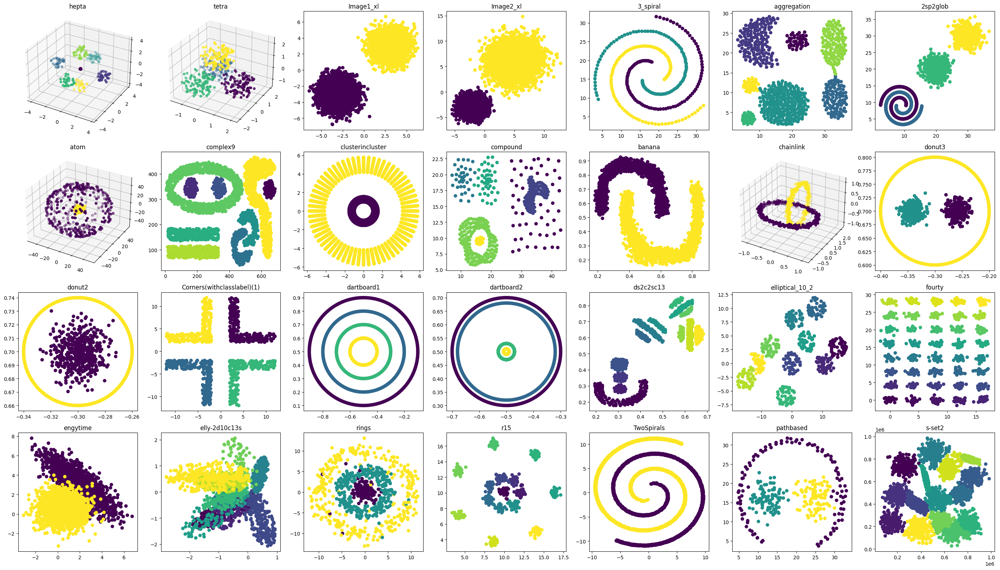

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets.items()):
  if name in ['hepta','tetra','atom','chainlink']:
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')
  else:
    ax = fig.add_subplot(4, 7, i+1)
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(df.iloc[:,-1], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(df.iloc[:,-1], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

--------------------------  ----------------------  ---------------------  -------------------  ----------------------  ---  ---  ----------------------  ----------------------  ----------------------  -------------------
Dataset                     OCVD                    Silhouette             DB                   Calinski Harabasz       ARI  NMI  C                       WB                      Dunn                    DSI
hepta                       0.9994942939288918      0.7019231989948803     0.3550385854651829   519.937197216115        1.0  1.0  -2.84878489350999e-17   0.45999145271242364     1.065010037278373       1.0
tetra                       0.886599422115829       0.5057889289788572     0.662644567562499    418.39120908961354      1.0  1.0  0.030801439909547087    1.2619768019239375      0.22286832447315746     0.8441585858585858
Image1_xl                   1.0                     0.7913951642342887     0.2948512326598793   90712.75543100772       1.0  1.0  0.0003062304098

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  ----------------
sDbw
hepta                          136.325
tetra                          292.417
Image1_xl                    12515.2
Image2_xl                    18966.8
3_spiral                      2945.19
aggregation                   2845.31
2sp2glob                      6381.36
atom                         21900.3
complex9                    292093
clusterincluster             15586.3
compound                      1373.12
banana                        1009.99
chainlink                      996.695
donut3                          42.2222
donut2                          26.6714
Corners(withclasslabel)(1)    3715.27
dartboard1                     250.486
dartboard2                     105.286
ds2c2sc13                       24.25
elliptical_10_2                845.166
fourty                         626.156
engytime                      5975.61
elly-2d10c13s                 1281.84
rings                         5237.01
r15                            226

In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  -----------
Gamma
hepta                       -0.147444
tetra                        0.0492714
Image1_xl                    1
Image2_xl                    1
3_spiral                    -0.173581
aggregation                 -0.0364493
2sp2glob                     0.890201
atom                        -0.0141698
complex9                     0.30021
clusterincluster            -0.00182245
compound                    -0.848782
banana                      -0.579177
chainlink                    0.617856
donut3                      -0.337428
donut2                      -0.00261602
Corners(withclasslabel)(1)  -0.327573
dartboard1                   0
dartboard2                   0
ds2c2sc13                    0.952081
elliptical_10_2             -0.756062
fourty                       1
engytime                    -0.997077
elly-2d10c13s                0.328466
rings                       -0.026587
r15                         -0.342569
TwoSpirals                  -0.08

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 1 & 0 & 1 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & nan & Gamma & nan \\
hepta & 0.9994942939288918 & 0.7019231989948803 & 0.3550385854651829 & 519.937197216115 & 1.0 & 1.0 & -2.84878489350999e-17 & 0.45999145271242364 & 1.065010037278373 & 1.0 & hepta & 136.32507463280916 & hepta & -0.14744351961950058 \\
tetra & 0.886599422115829 & 0.5057889289788572 & 0.662644567562499 & 418.39120908961354 & 1.0 & 1.0 & 0.030801439909547087 & 1.2619768019239375 & 0.22286832447315746 & 0.8441585858585858 & tetra & 292.41737320053807 & tetra & 0.049271425043220546 \\
Image1_xl & 1.0 & 0.7913951642342887 & 0.2948512326598793 & 90712.75543100772 & 1.0 & 1.0 & 0.00030623040989908933 & 0.2204320649834974 & 0.266037242007493 & 0.9943823208201641 & Image1_xl & 12515.164029856729 & Image1_xl & 1.0 \\
Image2_xl & 0.9999998644733616 & 0.7629931985268912 & 0.3324653336727169 & 63667.64760227627 & 1.0 & 1.0 

### cvdd

In [ ]:
from tabulate import tabulate
import gc
headers = ['cvdd']
data = []

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  ind = gpt_cvdd()
  dist_matrix = squareform(pdist(df.iloc[:,:-1], 'euclidean'))
  DD = ind.Density_involved_distance(dist_matrix, len(dist_matrix))
  value = ind.CVDD(df.iloc[:,-1], dist_matrix, DD)

  line.append(cvdd().calc_CVDD(df))

  del df, ind

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))

NameError: name 'gpt_cvdd' is not defined

## Kernel K-means indicator values

### Data preparation

In [ ]:
print(datasets['atom'].iloc[:,-1].values.tolist())

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
!pip install python-kkmeans
from kkmeans import kkmeans

truevalues = []
datasets2 = {}

for name,df in datasets.items():
  datasets2[name] = df.copy()

for name,df in datasets2.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = pd.Series(kkmeans(df.iloc[:,:-1].to_numpy(), n_clusters=truevalue.nunique()))
  except Exception as e:
    print(f"{name} :\n{e}")


In [ ]:
print(truevalues[7].values.tolist())
print(datasets['atom'].iloc[:,-1].values.tolist())
print(datasets2['atom'].iloc[:,-1].values.tolist())

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

### Visualization

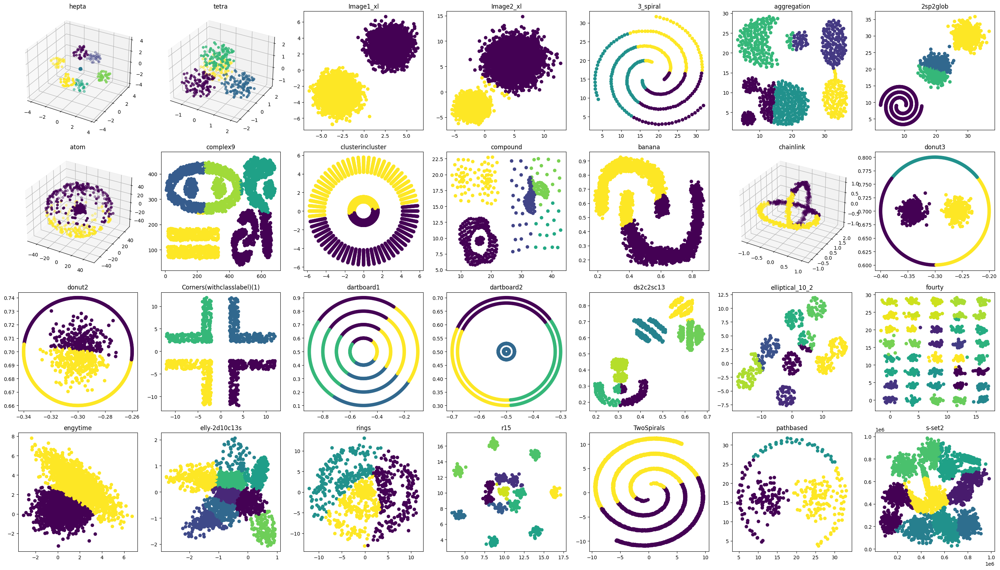

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets2.items()):
  if name in ['hepta','tetra','atom','chainlink']:
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')
  else:
    ax = fig.add_subplot(4, 7, i+1)
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]


  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))


  line.append(adjusted_rand_score(truevalues[i].values.tolist(), df.iloc[:,-1].values.tolist()))
  line.append(normalized_mutual_info_score(truevalues[i].values.tolist(), df.iloc[:,-1].values.tolist()))


  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")

  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

--------------------------  ----------------------  -------------------  -------------------  ------------------  -----------------------  ----------------------  ----------------------  ------------------  ---------------------  -------------------
Dataset                     OCVD                    Silhouette           DB                   Calinski Harabasz   ARI                      NMI                     C                       WB                  Dunn                   DSI
hepta                       0.9994128409731198      0.5482871486936561   0.8314848357747097   148.29032862905675  0.8499840365736853       0.9469100620090317      0.0939463347511192      1.6670001495401796  0.3414934972640843     0.9152542372881355
tetra                       0.886599422115829       0.5057889289788572   0.662644567562499    418.3912090896134   1.0                      1.0                     0.030801439909547087    1.261976801923938   0.22286832447315746    0.8441585858585859
Image1_xl         

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

sDbw
--------------------------
sDbw
hepta
tetra
Image1_xl
Image2_xl
3_spiral
aggregation
2sp2glob
atom
complex9
clusterincluster
compound
banana
chainlink
donut3
donut2
Corners(withclasslabel)(1)
dartboard1
dartboard2
ds2c2sc13
elliptical_10_2
fourty
engytime
elly-2d10c13s
rings
r15
TwoSpirals
pathbased
s-set2


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

Gamma
--------------------------
Gamma
hepta
tetra
Image1_xl
Image2_xl
3_spiral
aggregation
2sp2glob
atom
complex9
clusterincluster
compound
banana
chainlink
donut3
donut2
Corners(withclasslabel)(1)
dartboard1
dartboard2
ds2c2sc13
elliptical_10_2
fourty
engytime
elly-2d10c13s
rings
r15
TwoSpirals
pathbased
s-set2


In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 1 & 0 & 1 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & nan & Gamma & nan \\
hepta & 0.9994128409731198 & 0.5482871486936561 & 0.8314848357747097 & 148.29032862905675 & 0.8499840365736853 & 0.9469100620090317 & 0.0939463347511192 & 1.6670001495401796 & 0.3414934972640843 & 0.9152542372881355 & hepta & 222.39329885156582 & hepta & -0.7364248910027745 \\
tetra & 0.886599422115829 & 0.5057889289788572 & 0.662644567562499 & 418.3912090896134 & 1.0 & 1.0 & 0.030801439909547087 & 1.261976801923938 & 0.22286832447315746 & 0.8441585858585859 & tetra & 292.417373200538 & tetra & 0.9359101012595703 \\
Image1_xl & 1.0 & 0.7913951642342887 & 0.2948512326598793 & 90712.75543100772 & 1.0 & 1.0 & 0.00030623040989908933 & 0.2204320649834974 & 0.266037242007493 & 0.9943823208201641 & Image1_xl & 12515.164029856729 & Image1_xl & -1.0 \\
Image2_xl & 0.9998365661638405 & 0.7633118202885903 & 0.33242187319

### cvdd

In [ ]:
from tabulate import tabulate
import gc
headers = ['cvdd']
data = []

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(cvdd().calc_CVDD(df))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))

<ipython-input-25-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-25-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))


ValueError: NaN found as an edge weight. Edge (0, 0, {'weight': nan})

## Spectral - clustering indicator values

### Data preparation

In [ ]:
from sklearn.cluster import SpectralClustering

truevalues = []
datasets3 = {}
for name,df in datasets.items():
  datasets3[name] = df.copy()
for name,df in datasets3.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = SpectralClustering(n_clusters=truevalue.nunique(), random_state=42).fit_predict(df.iloc[:,:-1])
  except Exception as e:
    print(f"{name} :\n{e}")


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:393: UserWarning: Exited at iteration 313 with accuracies 
[2.98148793e-15 1.91648033e-05 1.07797500e-05]
not reaching the requested tolerance 1.1920928955078125e-05.
Use iteration 197 instead with accuracy 
7.330409460505629e-06.

  _, diffusion_map = lobpcg(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:393: UserWarning: Exited postprocessing with accuracies 
[1.35675098e-15 7.74579236e-06 1.42454360e-05]
not reaching the requested tolerance 1.1920928955078125e-05.
  _, diffusion_map = lobpcg(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/

### Visualization

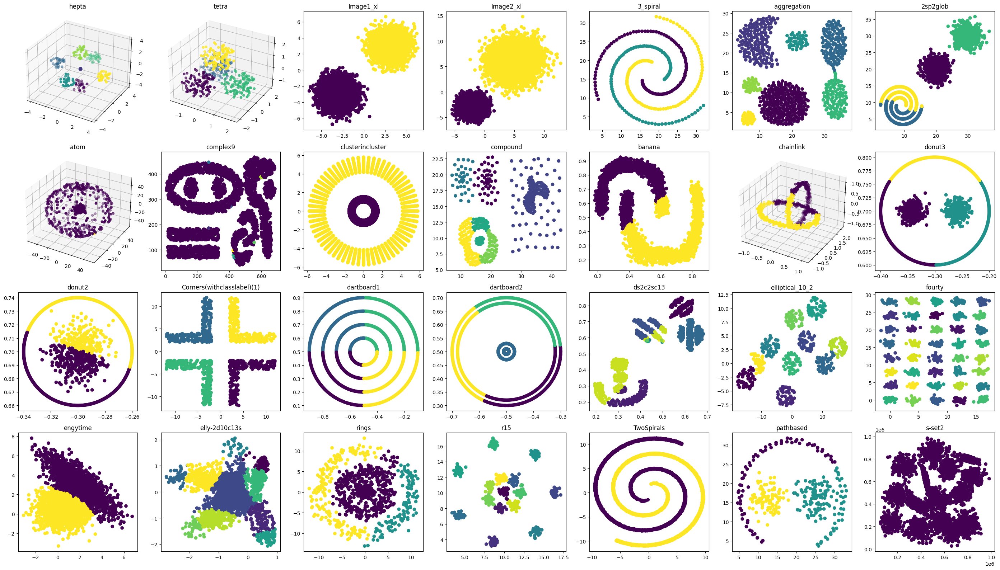

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets3.items()):
  if name in ['hepta','tetra','atom','chainlink']:
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')
  else:
    ax = fig.add_subplot(4, 7, i+1)
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

atom :
Data passed to ks_2samp must not be empty
complex9 :
Data passed to ks_2samp must not be empty
ds2c2sc13 :
Data passed to ks_2samp must not be empty
--------------------------  ---------------------  ---------------------  ------------------  --------------------  ----------------------  ---------------------  ----------------------  -------------------  ---------------------  -------------------
Dataset                     OCVD                   Silhouette             DB                  Calinski Harabasz     ARI                     NMI                    C                       WB                   Dunn                   DSI
hepta                       0.9994942939288918     0.7019231989948803     0.3550385854651829  519.937197216115      1.0                     1.0                    -5.69756978701998e-17   0.45999145271242364  1.065010037278373      1.0
tetra                       0.886599422115829      0.5057889289788572     0.662644567562499   418.39120908961337    1.0    

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  ----------------
sDbw
hepta                          136.325
tetra                          292.417
Image1_xl                    12515.2
Image2_xl                    18966.8
3_spiral                      2945.19
aggregation                   2833.72
2sp2glob                      5597.45
atom                         21927.1
complex9                    655753
clusterincluster             15586.3
compound                      1111.42
banana                         912.589
chainlink                      821.167
donut3                          32.0164
donut2                          22.481
Corners(withclasslabel)(1)    3715.27
dartboard1                     144.92
dartboard2                      58.9974
ds2c2sc13                       39.9424
elliptical_10_2                847.95
fourty                         626.156
engytime                      5876.93
elly-2d10c13s                 1033.44
rings                         4205.34
r15                            22

In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  -----------
Gamma
hepta                        0.779231
tetra                        1
Image1_xl                    1
Image2_xl                    1
3_spiral                     0.0280684
aggregation                  0.292685
2sp2glob                    -0.0806126
atom                        -0.272727
complex9                     0.0611636
clusterincluster            -0.00182245
compound                    -0.915649
banana                       0.0188425
chainlink                   -0.986423
donut3                       1
donut2                       1
Corners(withclasslabel)(1)   0.327573
dartboard1                   0.666142
dartboard2                   0.0348742
ds2c2sc13                   -0.506919
elliptical_10_2              0.356467
fourty                      -0.0684876
engytime                    -1
elly-2d10c13s               -0.358584
rings                       -0.288657
r15                          0.0850682
TwoSpirals                   0.085117

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 1 & 0 & 1 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & nan & Gamma & nan \\
hepta & 0.9994942939288918 & 0.7019231989948803 & 0.3550385854651829 & 519.937197216115 & 1.0 & 1.0 & -5.69756978701998e-17 & 0.45999145271242364 & 1.065010037278373 & 1.0 & hepta & 136.3250746328092 & hepta & 0.7792310741181133 \\
tetra & 0.886599422115829 & 0.5057889289788572 & 0.662644567562499 & 418.39120908961337 & 1.0 & 1.0 & 0.030801439909547087 & 1.2619768019239384 & 0.22286832447315746 & 0.8441585858585858 & tetra & 292.41737320053807 & tetra & 1.0 \\
Image1_xl & 1.0 & 0.7913951642342887 & 0.2948512326598793 & 90712.75543100772 & 1.0 & 1.0 & 0.00030623040989908933 & 0.2204320649834974 & 0.266037242007493 & 0.9943823208201641 & Image1_xl & 12515.164029856729 & Image1_xl & 1.0 \\
Image2_xl & 0.9999998644733616 & 0.7629931985268912 & 0.3324653336727169 & 63667.64760227627 & 1.0 & 1.0 & 0.0045522768427287

### cvdd

In [ ]:
from tabulate import tabulate
import gc
headers = ['cvdd']
data = []

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  try:
    line.append(cvdd().calc_CVDD(df))
  except Exception as e:
    print(f"{name}:\n{e}")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))

hepta:
NaN found as an edge weight. Edge (0, 0, {'weight': nan})


<ipython-input-25-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-25-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))
<ipython-input-25-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-25-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))


tetra:
NaN found as an edge weight. Edge (0, 0, {'weight': nan})


<ipython-input-25-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-25-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))


## Gaussian mixture indicator values

### Data preparation

In [ ]:
from sklearn.mixture import GaussianMixture

truevalues = []
datasets4 = {}
for name,df in datasets.items():
  datasets4[name] = df.copy()
for name,df in datasets4.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = GaussianMixture(n_components=truevalue.nunique(), random_state=42).fit_predict(df.iloc[:,:-1])
  except Exception as e:
    print(f"{name} :\n{e}")


### Visualization

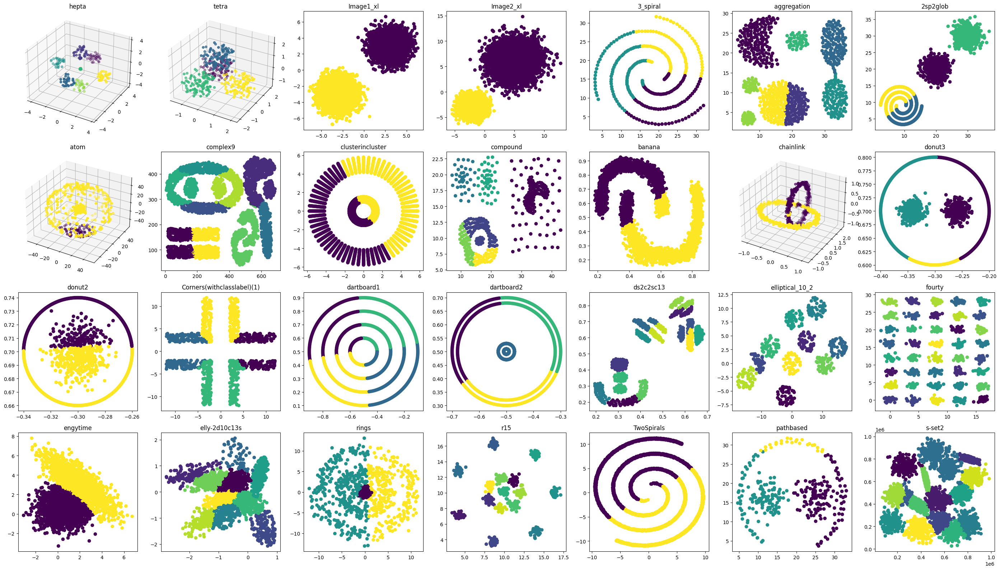

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets4.items()):
  if name in ['hepta','tetra','atom','chainlink']:
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')
  else:
    ax = fig.add_subplot(4, 7, i+1)
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

--------------------------  ---------------------  -------------------  -------------------  ------------------  ----------------------  ----------------------  ----------------------  -------------------  ---------------------  -------------------
Dataset                     OCVD                   Silhouette           DB                   Calinski Harabasz   ARI                     NMI                     C                       WB                   Dunn                   DSI
hepta                       0.9994942939288917     0.7019231989948803   0.35503858546518285  519.9371972161149   1.0                     0.9999999999999999      -2.84878489350999e-17   0.45999145271242375  1.065010037278373      1.0
tetra                       0.886599422115829      0.5057889289788572   0.662644567562499    418.39120908961354  1.0                     1.0                     0.030801439909547087    1.2619768019239375   0.22286832447315746    0.8441585858585858
Image1_xl                   1.0      

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  ----------------
sDbw
hepta                          136.325
tetra                          292.417
Image1_xl                    12515.2
Image2_xl                    18966.8
3_spiral                      1817.63
aggregation                   2725.35
2sp2glob                      5544.51
atom                         20080.1
complex9                    192507
clusterincluster             13498.5
compound                      1156.34
banana                         912.576
chainlink                      975.182
donut3                          32.1715
donut2                          22.5035
Corners(withclasslabel)(1)    3943.89
dartboard1                     144.942
dartboard2                      58.9974
ds2c2sc13                       18.9485
elliptical_10_2                847.834
fourty                         626.156
engytime                      5902.54
elly-2d10c13s                  848.71
rings                         4108.7
r15                            

In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

--------------------------  ----------
Gamma
hepta                       -0.280222
tetra                       -0.342183
Image1_xl                   -1
Image2_xl                   -1
3_spiral                     0.800298
aggregation                 -0.295947
2sp2glob                    -0.175855
atom                         0.999857
complex9                    -0.192683
clusterincluster             1
compound                    -0.782809
banana                       0.0534677
chainlink                   -0.659163
donut3                      -1
donut2                      -0.996027
Corners(withclasslabel)(1)   0.113797
dartboard1                  -0.320257
dartboard2                   0.260779
ds2c2sc13                    0.215117
elliptical_10_2             -0.188478
fourty                       0.0373764
engytime                     1
elly-2d10c13s               -0.375428
rings                        0.384687
r15                          0.164424
TwoSpirals                  -0.584241


In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 1 & 0 & 1 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & nan & Gamma & nan \\
hepta & 0.9994942939288917 & 0.7019231989948803 & 0.35503858546518285 & 519.9371972161149 & 1.0 & 0.9999999999999999 & -2.84878489350999e-17 & 0.45999145271242375 & 1.065010037278373 & 1.0 & hepta & 136.3250746328092 & hepta & -0.280221957986524 \\
tetra & 0.886599422115829 & 0.5057889289788572 & 0.662644567562499 & 418.39120908961354 & 1.0 & 1.0 & 0.030801439909547087 & 1.2619768019239375 & 0.22286832447315746 & 0.8441585858585858 & tetra & 292.41737320053807 & tetra & -0.34218325512472214 \\
Image1_xl & 1.0 & 0.7913951642342887 & 0.2948512326598793 & 90712.75543100772 & 1.0 & 1.0 & 0.00030623040989908933 & 0.2204320649834974 & 0.266037242007493 & 0.9943823208201641 & Image1_xl & 12515.164029856729 & Image1_xl & -1.0 \\
Image2_xl & 0.9999998644733616 & 0.7629931985268912 & 0.3324653336727169 & 63667.647602276

### cvdd

In [ ]:
from tabulate import tabulate
import gc
headers = ['cvdd']
data = []

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  try:
    line.append(cvdd().calc_CVDD(df))
  except Exception as e:
    print(f"{name}:\n{e}")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data, headers=headers))

hepta:
NaN found as an edge weight. Edge (0, 0, {'weight': nan})


<ipython-input-15-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-15-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))
<ipython-input-15-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-15-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))


tetra:
NaN found as an edge weight. Edge (0, 0, {'weight': nan})


<ipython-input-15-537177fc4131>:82: RuntimeWarning: invalid value encountered in divide
  fDen = Den / max_Den
<ipython-input-15-537177fc4131>:84: RuntimeWarning: invalid value encountered in divide
  Rel = np.tile(Den, (N, 1)).T / np.where(Den == 0, np.inf, np.tile(Den, (N, 1)))


# Real datasets

## dataset prep

In [ ]:
!pip install ucimlrepo
from ucimlrepo import fetch_ucirepo
from google.colab import drive
drive.mount('/content/drive')

hayes_roth = fetch_ucirepo(id=44)
X_hayes_roth = hayes_roth.data.features
y_hayes_roth = hayes_roth.data.targets
y_hayes_roth = y_hayes_roth.fillna(0)
hayes_roth = pd.concat([X_hayes_roth, y_hayes_roth], axis=1)

wine = fetch_ucirepo(id=109)
X_wine = wine.data.features
y_wine = wine.data.targets
wine = pd.concat([X_wine, y_wine], axis=1)

# seeds
seeds = pd.read_csv('/content/drive/MyDrive/seeds_dataset.txt', delimiter='\t', names=[0, 1, 2, 3, 4, 5, 6, 7])

glass_identification = fetch_ucirepo(id=42)
X_glass = glass_identification.data.features
y_glass = glass_identification.data.targets
glass = pd.concat([X_glass, y_glass], axis=1)

user_knowledge_modeling = fetch_ucirepo(id=257)
X_ukm = user_knowledge_modeling.data.features
y_ukm = user_knowledge_modeling.data.targets
mapping = {'very_low': 0, 'Very Low': 0, 'Low': 1, 'Middle': 2, 'High': 3}
y_ukm = y_ukm.replace(mapping)
ukm = pd.concat([X_ukm, y_ukm], axis=1)

# wireless indoor localization
wifi = pd.read_csv('/content/drive/MyDrive/wifi_localization.txt', delimiter='\t', names=[0, 1, 2, 3, 4, 5, 6, 7])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
datasets ={
    'hayes roth': hayes_roth,
    'wine': wine,
    'seeds': seeds,
    'glass': glass,
    'ukm': ukm,
    'wifi': wifi,
}

In [ ]:
for name,df in datasets.items():
  print(f"{name}:\n{df.info()}\n\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160 entries, 0 to 159
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   hobby              160 non-null    int64  
 1   age                160 non-null    int64  
 2   educational level  160 non-null    int64  
 3   marital status     160 non-null    int64  
 4   class              160 non-null    float64
dtypes: float64(1), int64(4)
memory usage: 6.4 KB
hayes roth:
None


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Alcohol                       178 non-null    float64
 1   Malicacid                     178 non-null    float64
 2   Ash                           178 non-null    float64
 3   Alcalinity_of_ash             178 non-null    float64
 4   Magnesium                  

## Ground Truth indicator values

### Visualization

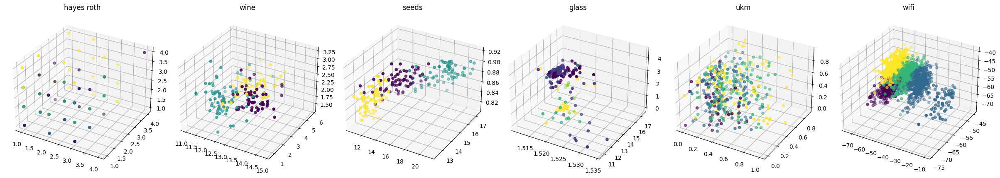

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(df.iloc[:,-1], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(df.iloc[:,-1], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  --------------------  --------------------  ------------------  ------------------  ---  ---  -------------------  ------------------  --------------------  -------------------
Dataset     OCVD                  Silhouette            DB                  Calinski Harabasz   ARI  NMI  C                    WB                  Dunn                  DSI
hayes roth  0.2575789442278261    -0.01948273592802994  5.524974698328454   8.685026051847464   1.0  1.0  0.36674110545381594  23.9492660998702    0.0                   0.15642773384890082
wine        0.9999999999923651    0.20008297882823034   1.5154862521642123  206.6781164482878   1.0  1.0  0.1763238048641131   1.2700909245303635  0.004784513270350985  0.4349979174469419
seeds       0.7927369449112139    0.4145082948852804    0.8123078617875398  310.4283643630765   1.0  1.0  0.08295493522721234  1.0002307638255623  0.04558827776655008   0.6501468993394459
glass       0.28214193334704396   -0.09144138663411631  3.736319790116272

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
256.71175971571415
23980.497470173534
333.5190956063298
336.081518759129
179.12329137397165
20609.02781379909
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
0.2744479495268139
-1.0
0.20365124331129997

0.9997119400835374
0.8754000840580647
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.2575789442278261 & -0.01948273592802994 & 5.524974698328454 & 8.685026051847464 & 1.0 & 1.0 & 0.36674110545381594 & 23.9492660998702 & 0.0 & 0.15642773384890082 & 256.71175971571415 & 0.2744479495268139 & - \\
wine & 0.9999999999923651 & 0.20008297882823034 & 1.5154862521642123 & 206.6781164482878 & 1.0 & 1.0 & 0.1763238048641131 & 1.2700909245303635 & 0.004784513270350985 & 0.4349979174469419 & 23980.497470173534 & -1.0 & - \\
seeds & 0.7927369449112139 & 0.4145082948852804 & 0.8123078617875398 & 310.4283643630765 & 1.0 & 1.0 & 0.08295493522721234 & 1.0002307638255623 & 0.04558827776655008 & 0.6501468993394459 & 333.5190956063298 & 0.20365124331129997 & - \\
glass & 0.28214193334704396 & -0.09144138663411631 & 3.7363197901162724 & 19.702067127104954 & 1.0 & 1.0 & 0.2676402346123909 & 12.668721428555834 

## Kernel K-means

### Data preparation

In [ ]:
!pip install python-kkmeans
from kkmeans import kkmeans

truevalues = []
datasets2 = {}

for name,df in datasets.items():
  datasets2[name] = df.copy()

for name,df in datasets2.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = pd.Series(kkmeans(df.iloc[:,:-1].to_numpy(), n_clusters=truevalue.nunique()))
  except Exception as e:
    print(f"{name} :\n{e}")

### Visualization

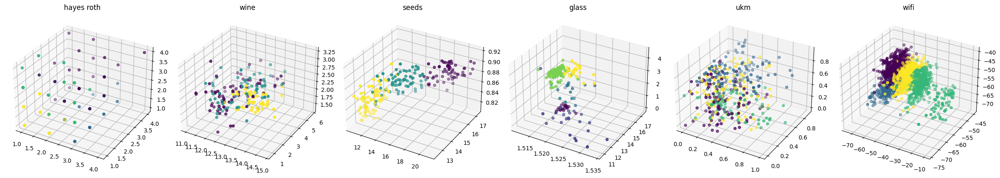

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets2.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  -------------------  -------------------  ------------------  ------------------  -------------------  -------------------  -------------------  ------------------  --------------------  -------------------
Dataset     OCVD                 Silhouette           DB                  Calinski Harabasz   ARI                  NMI                  C                    WB                  Dunn                  DSI
hayes roth  0.6334572154869399   0.20485773074061003  1.3757574774724168  39.93437242647207   0.02684114954065087  0.06536847789030394  0.20712181542200372  5.20854560524204    0.20851441405707477   0.42070352236826236
wine        1.0                  0.5708303868116225   0.531680181857682   556.1459974410649   0.37150007821195313  0.4193022149704782   0.05552972549768783  0.4719983623145958  0.022916707615641897  0.6971187441271652
seeds       0.8994344641408177   0.4719337319126887   0.7533139698796382  375.8049613895007   0.7166198557361053   0.6949250270680577   0.055

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
203.78892201780945
16540.277880026348
314.4399904896719
250.8886741868632
161.47683487381565
20383.98294332057
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets2.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
-0.9933993399339934
1.0
-0.9819258335930197

0.5900744416873449
0.6966046345453519
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.6334572154869399 & 0.20485773074061003 & 1.3757574774724168 & 39.93437242647207 & 0.02684114954065087 & 0.06536847789030394 & 0.20712181542200372 & 5.20854560524204 & 0.20851441405707477 & 0.42070352236826236 & 203.78892201780945 & -0.9933993399339934 & - \\
wine & 1.0 & 0.5708303868116225 & 0.531680181857682 & 556.1459974410649 & 0.37150007821195313 & 0.4193022149704782 & 0.05552972549768783 & 0.4719983623145958 & 0.022916707615641897 & 0.6971187441271652 & 16540.277880026348 & 1.0 & - \\
seeds & 0.8994344641408177 & 0.4719337319126887 & 0.7533139698796382 & 375.8049613895007 & 0.7166198557361053 & 0.6949250270680577 & 0.05584748208819477 & 0.8262264522851368 & 0.08550680193416635 & 0.7137986121258005 & 314.4399904896719 & -0.9819258335930197 & - \\
glass & 0.8361948069664487 & 0.3948209339120432 & 1.85

## Spectral Clustering

### Data preparation

In [ ]:
from sklearn.cluster import SpectralClustering

truevalues = []
datasets3 = {}
for name,df in datasets.items():
  datasets3[name] = df.copy()
for name,df in datasets3.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = SpectralClustering(n_clusters=truevalue.nunique(), random_state=42).fit_predict(df.iloc[:,:-1])
  except Exception as e:
    print(f"{name} :\n{e}")

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:420: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  est = KMeans(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:393: UserWarning: Exited at iteration 549 with accuracies 
[2.38926435e-15 4.13386956e-05 2.34135727e-05 2.83901124e-05
 2.63983745e-05]
not reaching the requested tolerance 2.9802322387695312e-05.
Use iteration 534 instead with accuracy 
2.306702575235821e-05.

  _, diffusion_map = lobpcg(
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:393: UserWarning: Exited postprocessing with accuracies 
[1.66918133e-15 3.85397401e-05 1.92929698e-05 3.08941966e-05
 2.66082226e-05]
not reach

### Visualization

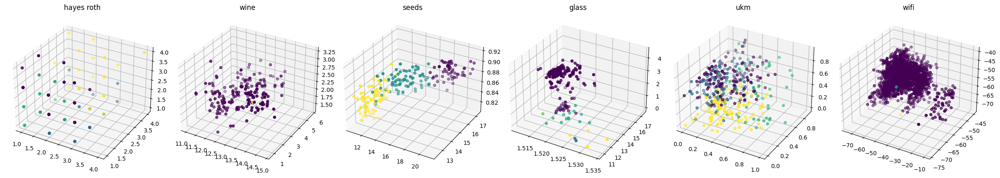

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets3.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

wine :
Data passed to ks_2samp must not be empty
wifi :
Data passed to ks_2samp must not be empty
----------  -------------------  --------------------  -------------------  ------------------  -----------------------  --------------------  -------------------  ------------------  --------------------  -------------------
Dataset     OCVD                 Silhouette            DB                   Calinski Harabasz   ARI                      NMI                   C                    WB                  Dunn                  DSI
hayes roth  0.6351071042910419   0.21115233076885592   1.3977506933240307   39.10659595857335   0.010195856481252345     0.04219894367386381   0.20692294221832785  5.318795842531011   0.21320071635561041   0.4222709563424484
wine        1.0                  0.28034808703238107   0.44772255236450287  3.3691025466629982  0.000351000351000351     0.011127710630567805  0.5002436648235585   104.47886198912114  0.017952322225228773
seeds       0.8930946647717328   0.4

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
203.5582925280827
45690.56486165373
317.9240458221218
335.31322551085736
161.12570821014015
39272.25666417385
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets3.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
0.4936708860759494
1.0
-0.9813744380218369

-0.5254237288135594
-1.0
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.6351071042910419 & 0.21115233076885592 & 1.3977506933240307 & 39.10659595857335 & 0.010195856481252345 & 0.04219894367386381 & 0.20692294221832785 & 5.318795842531011 & 0.21320071635561041 & 0.4222709563424484 & 203.5582925280827 & 0.4936708860759494 & - \\
wine & 1.0 & 0.28034808703238107 & 0.44772255236450287 & 3.3691025466629982 & 0.000351000351000351 & 0.011127710630567805 & 0.5002436648235585 & 104.47886198912114 & 0.017952322225228773 & None & 45690.56486165373 & 1.0 & - \\
seeds & 0.8930946647717328 & 0.46397156229690856 & 0.7639818971003747 & 361.325039798768 & 0.6733797282072568 & 0.6793796158576625 & 0.06022787702020038 & 0.8593370671817434 & 0.053548961352155096 & 0.7034784319892252 & 317.9240458221218 & -0.9813744380218369 & - \\
glass & 0.9795451203093595 & 0.42734550655207626 & 0.7800016436

## Gaussian Mixture Model

### Data preparation

In [ ]:
from sklearn.mixture import GaussianMixture

truevalues = []
datasets4 = {}
for name,df in datasets.items():
  datasets4[name] = df.copy()
for name,df in datasets4.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = GaussianMixture(n_components=truevalue.nunique(), random_state=42).fit_predict(df.iloc[:,:-1])
  except Exception as e:
    print(f"{name} :\n{e}")

### Visualization

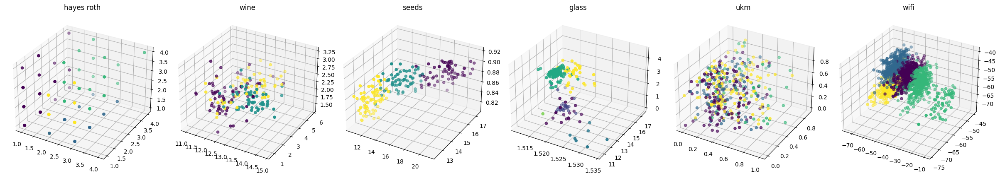

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets4.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  -------------------  -------------------  ------------------  ------------------  -------------------  --------------------  -------------------  ------------------  ---------------------  -------------------
Dataset     OCVD                 Silhouette           DB                  Calinski Harabasz   ARI                  NMI                   C                    WB                  Dunn                   DSI
hayes roth  0.629675274453734    0.18009194499227618  1.4893864848076936  32.004032156899285  0.01274793272930918  0.037210116997417525  0.25092253868514647  6.499181071318862   0.21320071635561041    0.406452405100438
wine        0.999999994517478    0.28326046005723704  0.8399962843528668  181.20047910677056  0.6074836799117163   0.5823426983774576    0.17226514584077823  1.448671666289163   0.0029989691918339196  0.47618149541178845
seeds       0.8659637933732328   0.4505982185449036   0.7791941070175353  353.8895187602873   0.8002139356626908   0.7611140254467036 

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
210.37304664729243
22960.309545915978
319.9210699521684
218.52133757652612
162.82474897951892
20528.891677668253
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets4.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
0.6807228915662651
0.8888888888888888
-0.9951500454683238

0.7651953690303908
-0.8629701345164972
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.629675274453734 & 0.18009194499227618 & 1.4893864848076936 & 32.004032156899285 & 0.01274793272930918 & 0.037210116997417525 & 0.25092253868514647 & 6.499181071318862 & 0.21320071635561041 & 0.406452405100438 & 210.37304664729243 & 0.6807228915662651 & - \\
wine & 0.999999994517478 & 0.28326046005723704 & 0.8399962843528668 & 181.20047910677056 & 0.6074836799117163 & 0.5823426983774576 & 0.17226514584077823 & 1.448671666289163 & 0.0029989691918339196 & 0.47618149541178845 & 22960.309545915978 & 0.8888888888888888 & - \\
seeds & 0.8659637933732328 & 0.4505982185449036 & 0.7791941070175353 & 353.8895187602873 & 0.8002139356626908 & 0.7611140254467036 & 0.06396022567831043 & 0.8773924729042969 & 0.04951009479047996 & 0.6980859870687052 & 319.9210699521684 & -0.9951500454683238 & - \\
glass & 0.7936145461733

## K-means

### Data preparation

In [ ]:
from sklearn.cluster import KMeans

truevalues = []
datasets5 = {}

for name,df in datasets.items():
  datasets5[name] = df.copy()

for name,df in datasets5.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = pd.Series(KMeans(n_clusters=truevalue.nunique(), random_state=42, n_init="auto").fit_predict(df.iloc[:,:-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")

### Visualization

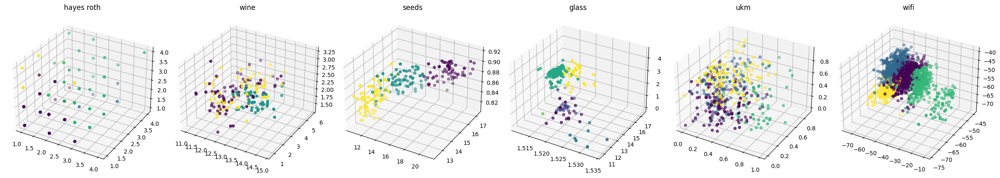

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets5.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets5.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  -------------------  -------------------  ------------------  ------------------  -------------------  -------------------  --------------------  ------------------  -------------------  ------------------
Dataset     OCVD                 Silhouette           DB                  Calinski Harabasz   ARI                  NMI                  C                     WB                  Dunn                 DSI
hayes roth  0.6162911894895498   0.20270317704510346  1.4629021522406902  36.544578083767924  0.03153771861839006  0.08671863034429668  0.2138258780361151    5.691678790851543   0.23570226039551587  0.4370742097683201
wine        1.0                  0.571138193786884    0.5342431775436286  561.815657860671    0.37111371823084754  0.4287568597645355   0.054848607993673006  0.4672351087535895  0.01626043915542385  0.6968494618392768
seeds       0.8994344641408177   0.4719337319126887   0.7533139698796382  375.8049613895007   0.7166198557361053   0.6949250270680577   0.05584

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets5.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
210.201282995297
16565.44979185543
314.4399904896719
214.44780670382474
161.80634063988558
20414.612161589794
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets5.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
0.9527027027027027
0.8947368421052632
-0.9819258335930197

0.9075505839776279
-0.8209576769383264
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.6162911894895498 & 0.20270317704510346 & 1.4629021522406902 & 36.544578083767924 & 0.03153771861839006 & 0.08671863034429668 & 0.2138258780361151 & 5.691678790851543 & 0.23570226039551587 & 0.4370742097683201 & 210.201282995297 & 0.9527027027027027 & - \\
wine & 1.0 & 0.571138193786884 & 0.5342431775436286 & 561.815657860671 & 0.37111371823084754 & 0.4287568597645355 & 0.054848607993673006 & 0.4672351087535895 & 0.01626043915542385 & 0.6968494618392768 & 16565.44979185543 & 0.8947368421052632 & - \\
seeds & 0.8994344641408177 & 0.4719337319126887 & 0.7533139698796382 & 375.8049613895007 & 0.7166198557361053 & 0.6949250270680577 & 0.05584748208819477 & 0.8262264522851368 & 0.08550680193416635 & 0.7137986121258005 & 314.4399904896719 & -0.9819258335930197 & - \\
glass & 0.8517822654590592 & 0.4442811600335

## DBSCAN

### DBSCAN parameters

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN

def calculate_knee(k_distances, percentile=0.95):
    """
    Calculate the knee point in the sorted k-distances using a specified percentile.
    """
    idx = int(len(k_distances) * percentile)
    return k_distances[idx]

def find_best_dbscan_params(X, min_samples_range, percentile=0.95):
    best_eps = None
    best_min_samples = None
    best_score = -1

    for min_samples in min_samples_range:
        # Compute k-distances
        nbrs = NearestNeighbors(n_neighbors=min_samples).fit(X)
        distances, indices = nbrs.kneighbors(X)
        k_distances = distances[:, -1]

        # Sort k-distances and find knee point
        k_distances = np.sort(k_distances)
        eps = calculate_knee(k_distances, percentile)

        # Run DBSCAN with the current eps and min_samples
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
        labels = db.labels_

        # Compute silhouette score if there are at least 2 clusters
        if len(set(labels)) > 1:
            score = silhouette_score(X, labels)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

    return best_eps, best_min_samples

### Data preparation

In [ ]:
from sklearn.cluster import DBSCAN

truevalues = []
datasets6 = {}

for name,df in datasets.items():
  datasets6[name] = df.copy()

for name,df in datasets6.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)

  min_samples_range = range(2, 10)
  best_eps, best_min_samples = find_best_dbscan_params(df.iloc[:,:-1].to_numpy(), min_samples_range, percentile=0.67)

  df.iloc[:,-1] = pd.Series(DBSCAN(eps=best_eps, min_samples=best_min_samples).fit_predict(df.iloc[:,:-1].to_numpy()))

### Visualization

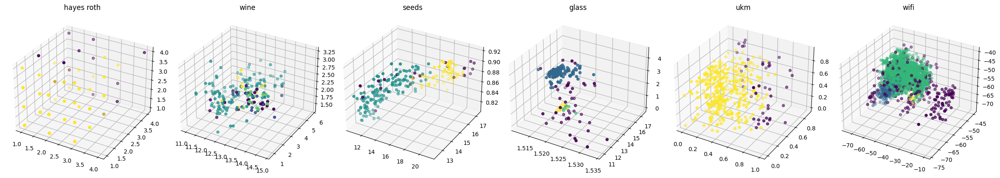

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets6.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets6.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  -------------------  -------------------  ------------------  ------------------  -------------------  -------------------  -------------------  ------------------  --------------------  -------------------
Dataset     OCVD                 Silhouette           DB                  Calinski Harabasz   ARI                  NMI                  C                    WB                  Dunn                  DSI
hayes roth  0.8876487725885941   0.28587245468205424  1.9248363816455938  21.211803908434725  0.114963830639388    0.2467863759667076   0.17741579280072153  14.897365700912633  0.2948839123097943    0.33732291722213337
wine        1.0                  0.35602370685734125  2.388107684127152   115.97323614757431  0.26915691073852516  0.37277371381932256  0.07999536192802216  1.8646543563277387  0.005484952465403627  0.7856144351067742
seeds       0.8340956382888479   0.38137983665473735  2.080824577041351   110.4325904185924   0.38115078951904     0.4436889459911342   0.128

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets6.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
261.7589062931525
19719.307964574444
461.80389242386224
292.6370224832979
200.3504204700811
32850.021783992124
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets6.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


-------------------
Gamma
-1.0
-0.15
0.24242424242424243

-0.9993006993006993
0.8143779617768057
-------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.8876487725885941 & 0.28587245468205424 & 1.9248363816455938 & 21.211803908434725 & 0.114963830639388 & 0.2467863759667076 & 0.17741579280072153 & 14.897365700912633 & 0.2948839123097943 & 0.33732291722213337 & 261.7589062931525 & -1.0 & - \\
wine & 1.0 & 0.35602370685734125 & 2.388107684127152 & 115.97323614757431 & 0.26915691073852516 & 0.37277371381932256 & 0.07999536192802216 & 1.8646543563277387 & 0.005484952465403627 & 0.7856144351067742 & 19719.307964574444 & -0.15 & - \\
seeds & 0.8340956382888479 & 0.38137983665473735 & 2.080824577041351 & 110.4325904185924 & 0.38115078951904 & 0.4436889459911342 & 0.12888462682797427 & 2.811669986396736 & 0.036231397491189726 & 0.46234137736344455 & 461.80389242386224 & 0.24242424242424243 & - \\
glass & 0.8761623494211138 & 0.4735204993573787 & 1.42850462224655

## Hierarchical Agglomerative Clustering

### Data preparation

In [ ]:
from sklearn.cluster import AgglomerativeClustering as ag

truevalues = []
datasets7 = {}

for name,df in datasets.items():
  datasets7[name] = df.copy()

for name,df in datasets7.items():
  truevalue = df.copy().iloc[:,-1]
  truevalues.append(truevalue)
  try:
    df.iloc[:,-1] = pd.Series(ag(n_clusters=truevalue.nunique()).fit_predict(df.iloc[:,:-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")

### Visualization

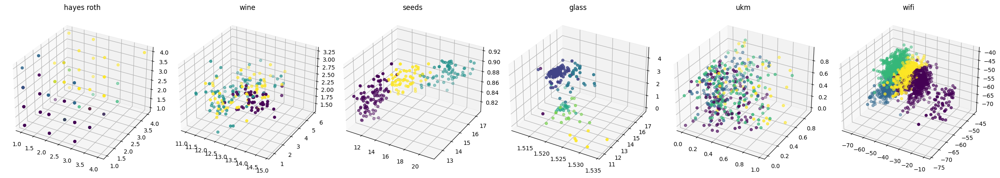

In [ ]:
fig = plt.figure(figsize=(28, 16))
for i, (name, df) in enumerate(datasets7.items()):
    ax = fig.add_subplot(4, 7, i+1, projection='3d')
    ax.scatter(df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2], c=df.iloc[:, -1], cmap='viridis')
    ax.set_title(f'{name}')

plt.tight_layout()
plt.show()

### Value table

In [ ]:
from tabulate import tabulate
import gc
headers = ['Dataset', 'OCVD', 'Silhouette', 'DB', 'Calinski Harabasz', 'ARI', 'NMI', 'C', 'WB', 'Dunn', 'DSI']
data = [headers]

for i, (name, df) in enumerate(datasets7.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = [name]

  df_copy = df.copy()
  df_copy.rename(columns={df.columns[-1]: 'labels'}, inplace=True)
  ocvd = OCVD()
  line.append(ocvd.calc_OCVD(df_copy))
  del df_copy

  line.append(silhouette_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(davies_bouldin_score(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1]))

  line.append(adjusted_rand_score(truevalues[i], df.iloc[:,-1]))
  line.append(normalized_mutual_info_score(truevalues[i], df.iloc[:,-1]))

  line.append(calc_c_index(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))

  p = df.iloc[:,-1].nunique()
  l = len(df)
  line.append((1/calinski_harabasz_score(df.iloc[:,:-1], df.iloc[:,-1])) * p*(l-p)/(p-1))
  line.append(base.dunn([x.to_numpy() for x in ocvd.clusters_test]))
  del ocvd

  try:
    line.append(dsi().separability_index_ks_2samp(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name} :\n{e}")
  '''
  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))
  line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  line.append(cvdd().calc_CVDD(df))
  '''
  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.DataFrame(data)

----------  -------------------  -------------------  ------------------  ------------------  -------------------  -------------------  --------------------  -------------------  --------------------  ------------------
Dataset     OCVD                 Silhouette           DB                  Calinski Harabasz   ARI                  NMI                  C                     WB                   Dunn                  DSI
hayes roth  0.6075985652772663   0.19321713038384575  1.4173258232778307  36.02698661645357   0.11519111829376998  0.13989753671213087  0.20175134798886446   5.773449836767813    0.21320071635561041   0.385787632760212
wine        1.0                  0.5644796401732071   0.5357343073560251  552.851711505718    0.36840191587483156  0.4160766539899294   0.05568901993558673   0.47481086616349394  0.022374511405772082  0.6983476484520482
seeds       0.9088047674919157   0.449360862303228    0.7637021877764493  352.83550286580163  0.7131537289031059   0.7309222111874399   

In [ ]:
from tabulate import tabulate
import gc
headers = ['sDbw']
data = [headers]

for i, (name, df) in enumerate(datasets7.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  line.append(sDbw().S_Dbw(df.iloc[:,:-1], df.iloc[:,-1]))

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

------------------
sDbw
212.5939668226383
16614.94455896234
321.4830740256299
221.29336395490006
164.79381823934867
20619.979227544474
------------------


In [ ]:
from tabulate import tabulate
import gc
headers = ['Gamma']
data = [headers]

for i, (name, df) in enumerate(datasets7.items()):
  df.iloc[:,-1] = LabelEncoder().fit_transform(df.iloc[:,-1])

  line = []

  try:
    line.append(calculate_gamma(df.iloc[:,:-1].to_numpy(), df.iloc[:,-1].to_numpy()))
  except Exception as e:
    print(f"{name}:\n{e}\n\n")

  del df

  data.append(line)

  gc.collect()

print(tabulate(data))
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

glass:
division by zero


--------------------
Gamma
1.0
-0.21052631578947367
0.16602772043644942

0.9846768820786143
-0.07121608221400884
--------------------


In [ ]:
data = [['CVDD'],['-'],['-'],['-'],['-'],['-'],['-']]
value_table = pd.concat([value_table, pd.DataFrame(data)], axis=1)

In [ ]:
formattable([value_table.columns.values.tolist()] + value_table.values.tolist())

0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9 & 10 & 0 & 0 & 0 \\
Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\
hayes roth & 0.6075985652772663 & 0.19321713038384575 & 1.4173258232778307 & 36.02698661645357 & 0.11519111829376998 & 0.13989753671213087 & 0.20175134798886446 & 5.773449836767813 & 0.21320071635561041 & 0.385787632760212 & 212.5939668226383 & 1.0 & - \\
wine & 1.0 & 0.5644796401732071 & 0.5357343073560251 & 552.851711505718 & 0.36840191587483156 & 0.4160766539899294 & 0.05568901993558673 & 0.47481086616349394 & 0.022374511405772082 & 0.6983476484520482 & 16614.94455896234 & -0.21052631578947367 & - \\
seeds & 0.9088047674919157 & 0.449360862303228 & 0.7637021877764493 & 352.83550286580163 & 0.7131537289031059 & 0.7309222111874399 & 0.06356658709944872 & 0.8800134835583606 & 0.07944684556020326 & 0.7095662931394003 & 321.4830740256299 & 0.16602772043644942 & - \\
glass & 0.8961617093442338 & 0.4621918906200732 & 0.981

# round off

In [ ]:
import re

def round_floats(input_str):
    def round_match(match):
        return f"{float(match.group()):.5f}"

    rounded_str = re.sub(r"[-+]?\d*\.\d+|\d+", round_match, input_str)
    return rounded_str

In [ ]:
print(round_floats(input()))

Dataset & OCVD & Silhouette & DB & Calinski Harabasz & ARI & NMI & C & WB & Dunn & DSI & sDbw & Gamma & CVDD \\     \hline     hepta & 0.9994942939288918 & 0.7019231989948803 & 0.3550385854651829 & 519.937197216115 & 1.0 & 1.0 & -2.84878489350999e-17 & 0.45999145271242364 & 1.065010037278373 & 1.0  & 136.32507463280916 & -0.14744351961950058 & -\\     tetra & 0.886599422115829 & 0.5057889289788572 & 0.662644567562499 & 418.39120908961354 & 1.0 & 1.0 & 0.030801439909547087 & 1.2619768019239375 & 0.22286832447315746 & 0.8441585858585858 & 292.41737320053807  & 0.049271425043220546 & -\\     Image1_xl & 1.0 & 0.7913951642342887 & 0.2948512326598793 & 90712.75543100772 & 1.0 & 1.0 & 0.00030623040989908933 & 0.2204320649834974 & 0.266037242007493 & 0.9943823208201641 & 12515.164029856729  & 1.0 & -\\     Image2_xl & 0.9999998644733616 & 0.7629931985268912 & 0.3324653336727169 & 63667.64760227627 & 1.0 & 1.0 & 0.004552276842728754 & 0.31406845946174233 & 0.0592860595449447 & 0.96613513819963

# Gamma for Glass

In [ ]:
!pip install python-kkmeans
from kkmeans import kkmeans
from sklearn.cluster import SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering as ag

In [ ]:
def safe_division(numerator, denominator):
    return numerator / denominator if denominator != 0 else 0

def gamma_index(data, labels, n_clusters):
    # Convert DataFrame to NumPy array if necessary
    if isinstance(data, pd.DataFrame):
        data = data.values

    intra_distances = []
    inter_distances = []

    for cluster_id in range(n_clusters):
        cluster_points = data[labels == cluster_id]
        if len(cluster_points) > 1:
            intra_distance = np.mean([np.linalg.norm(p1 - p2) for i, p1 in enumerate(cluster_points) for p2 in cluster_points[i+1:]])
        else:
            intra_distance = 0  # Avoid division by zero for single-point clusters
        intra_distances.append(intra_distance)

    for i in range(n_clusters):
        for j in range(i + 1, n_clusters):
            cluster1_points = data[labels == i]
            cluster2_points = data[labels == j]
            if len(cluster1_points) > 0 and len(cluster2_points) > 0:
                inter_distance = np.mean([np.linalg.norm(p1 - p2) for p1 in cluster1_points for p2 in cluster2_points])
            else:
                inter_distance = 0  # Avoid division by zero for empty clusters
            inter_distances.append(inter_distance)

    intra_mean = np.mean(intra_distances) if len(intra_distances) > 0 else 0
    inter_mean = np.mean(inter_distances) if len(inter_distances) > 0 else 0
    return safe_division(inter_mean - intra_mean, inter_mean + intra_mean)

In [ ]:
df = datasets['glass']
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
df.iloc[:,-1] = pd.Series(kkmeans(df.iloc[:,:-1].to_numpy(), n_clusters=6))
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
df.iloc[:,-1] = SpectralClustering(n_clusters=6, random_state=42).fit_predict(df.iloc[:,:-1])
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
df.iloc[:,-1] = GaussianMixture(n_components=6, random_state=42).fit_predict(df.iloc[:,:-1])
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
df.iloc[:,-1] = pd.Series(KMeans(n_clusters=6, random_state=42, n_init="auto").fit_predict(df.iloc[:,:-1].to_numpy()))
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
min_samples_range = range(2, 10)
best_eps, best_min_samples = find_best_dbscan_params(df.iloc[:,:-1].to_numpy(), min_samples_range, percentile=0.67)
df.iloc[:,-1] = pd.Series(DBSCAN(eps=best_eps, min_samples=best_min_samples).fit_predict(df.iloc[:,:-1].to_numpy()))
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))
df.iloc[:,-1] = pd.Series(ag(n_clusters=6).fit_predict(df.iloc[:,:-1].to_numpy()))
print(gamma_index(df.iloc[:,:-1].to_numpy(),df.iloc[:,-1].to_numpy(),6))


0.392510948883476
0.3209548964914981
0.5820686563522194
0.5395590652816756
0.5434446301545951
0.21619667417744126
0.392510948883476
